חברי צוות:   
ברוך רוטמן   
דור רוזנהק  
רועי אמזלג

תיאור מבנה התכנית בצורת תרשים UML  
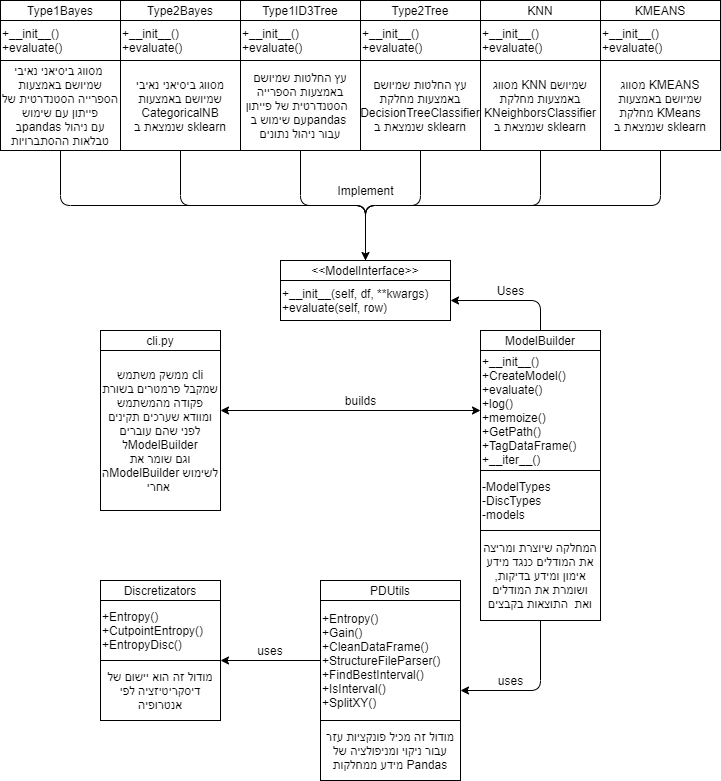

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

df = pd.read_csv("../train.csv")
print(df.head())

age           job  marital  education default  balance housing loan  \
0   58    management  married   tertiary      no   2143.0     yes   no   
1   44    technician   single  secondary      no     29.0     yes   no   
2   33  entrepreneur  married  secondary      no      2.0     yes  yes   
3   47   blue-collar  married    unknown      no   1506.0     yes   no   
4   33       unknown   single    unknown      no      1.0      no   no   

   contact  day month  duration  campaign  previous poutcome class  
0  unknown    5   may     261.0         1         0  unknown    no  
1  unknown    5   may     151.0         1         0  unknown    no  
2  unknown    5   may      76.0         1         0  unknown    no  
3  unknown    5   may      92.0         1         0  unknown    no  
4  unknown    5   may     198.0         1         0  unknown    no  


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42180 entries, 0 to 42179
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        42180 non-null  int64  
 1   job        42180 non-null  object 
 2   marital    42180 non-null  object 
 3   education  42178 non-null  object 
 4   default    42180 non-null  object 
 5   balance    42175 non-null  float64
 6   housing    42177 non-null  object 
 7   loan       42179 non-null  object 
 8   contact    42173 non-null  object 
 9   day        42180 non-null  int64  
 10  month      42180 non-null  object 
 11  duration   42169 non-null  float64
 12  campaign   42180 non-null  int64  
 13  previous   42180 non-null  int64  
 14  poutcome   42180 non-null  object 
 15  class      42180 non-null  object 
dtypes: float64(2), int64(4), object(10)
memory usage: 5.1+ MB


Our observations on missing data and the datatypes here:

- Out of 16 columns, only 10 columns have complete data.
- Many of the columns have discrete values (object->strings), which may be need to be given numeric identifier for use with SKLearn classifiers.

In [3]:
missing_data = pd.DataFrame({'total_missing': df.isnull().sum(), 'perc_missing': (df.isnull().sum()/82790)*100})
missing_data

,total_missing,perc_missing
age,0,0.000000
job,0,0.000000
marital,0,0.000000
education,2,0.002416
default,0,0.000000
balance,5,0.006039
housing,3,0.003624
loan,1,0.001208
contact,7,0.008455
day,0,0.000000


In [4]:
df.describe()

,age,balance,day,duration,campaign,previous
count,42180.000000,42175.000000,42180.000000,42169.000000,42180.000000,42180.000000
mean,40.739379,1321.708880,15.864391,255.429273,2.824941,0.450403
std,10.097570,2984.706622,8.303157,258.178684,3.175839,2.143422
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,0.000000
25%,33.000000,61.000000,8.000000,101.000000,1.000000,0.000000
50%,39.000000,425.000000,16.000000,176.000000,2.000000,0.000000
75%,48.000000,1369.500000,21.000000,314.000000,3.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,275.000000


Some more important observations here, before we dive into performing the pre-processing tasks onto our data:

- Most of the balance are around 61 - 1369.5, but the extremes are at -8019, 102127
- Most of the ages are around 18 - 48, but the maximum age is 95

Let's visualize the numerical quantities in our dataset as boxplots, to have a better sense of the outliers.

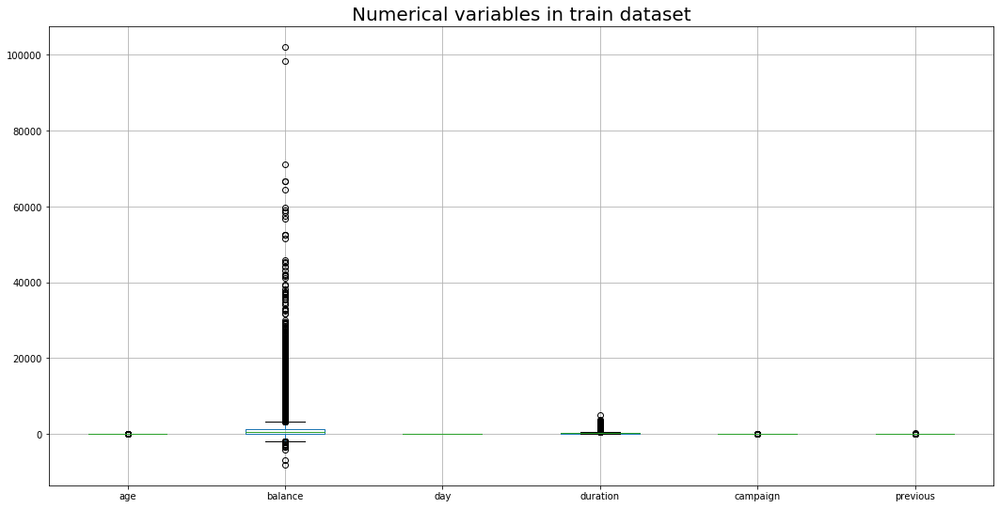

In [5]:
num_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'previous']
plt.figure(figsize=(18,9))
df[num_cols].boxplot()
plt.title("Numerical variables in train dataset", fontsize=20)
plt.show()

In [6]:
df.sort_values(by=['balance'], ascending=False).head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,previous,poutcome,class
39989,51,management,single,tertiary,no,102127.0,no,no,cellular,3,jun,90.0,1,0,unknown,no
26227,59,management,married,tertiary,no,98417.0,no,no,telephone,20,nov,145.0,5,0,unknown,no
41693,60,retired,married,primary,no,71188.0,no,no,cellular,6,oct,205.0,1,0,unknown,no
19785,56,management,divorced,tertiary,no,66721.0,no,no,cellular,8,aug,442.0,2,0,unknown,no
21192,52,blue-collar,married,primary,no,66653.0,no,no,cellular,14,aug,109.0,3,0,unknown,no
19420,59,admin.,married,unknown,no,64343.0,no,no,cellular,6,aug,45.0,4,0,unknown,no
41374,32,entrepreneur,single,tertiary,no,59649.0,no,no,cellular,1,sep,69.0,2,0,unknown,no
12926,56,blue-collar,married,secondary,no,58932.0,no,no,telephone,7,jul,339.0,2,0,unknown,no
920,44,admin.,married,secondary,no,58544.0,yes,no,unknown,7,may,144.0,2,0,unknown,no
27390,50,services,married,secondary,no,57435.0,yes,no,cellular,21,nov,319.0,3,0,unknown,no


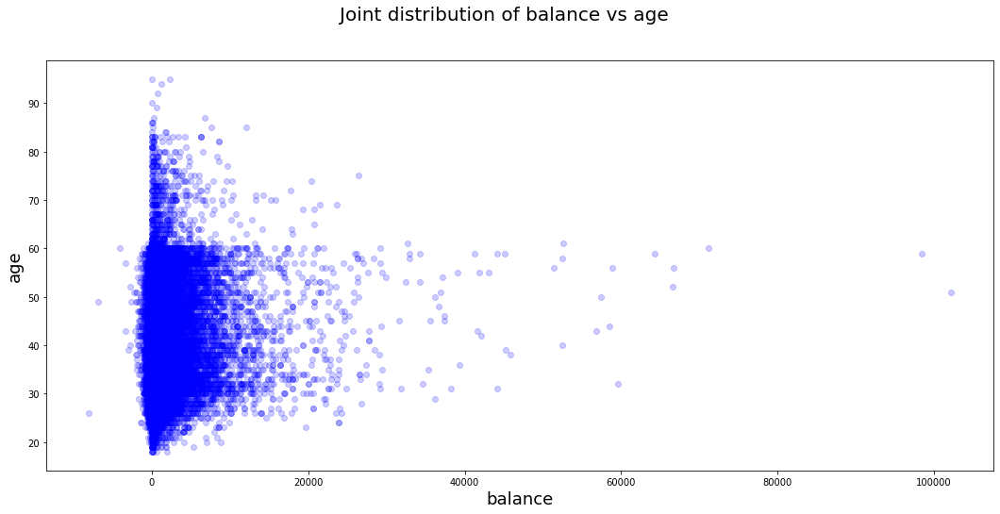

In [7]:
plt.figure(figsize=(18,8))
plt.xlabel("balance", fontsize=18)
plt.ylabel("age", fontsize=18)
plt.suptitle("Joint distribution of balance vs age", fontsize= 20)
plt.plot(df.balance, df['age'], 'bo', alpha=0.2)
plt.show()

We can see significant deviation from balance for age (the 'poorest' people are the young and the old)
, infact for all other numerical variables as well we can expect the 'apparent' outliers, from the boxplot, to behave similarly. Now, we'll head to analyze the dataset for suitable visualizations.

Text(0.5, 0.98, 'Initial Distributions of features')

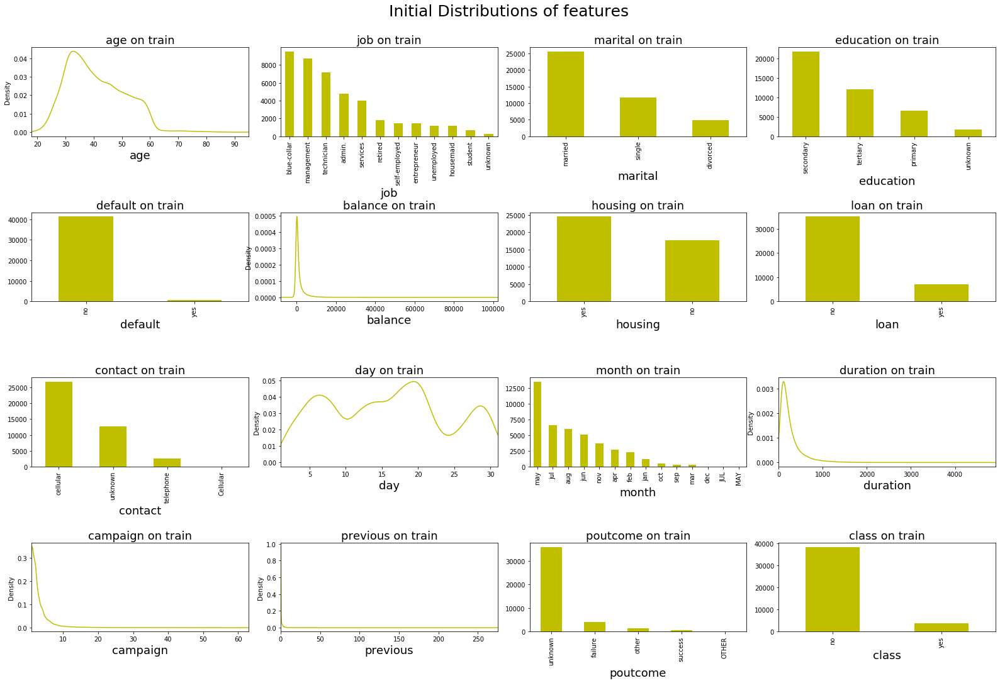

In [8]:
def plot_dist(col, ax):
    if col not in ['age', 'balance', 'day','duration','campaign', 'previous']:
        df[col].value_counts().plot(kind='bar', facecolor='y', ax=ax)
    else:
        df[col].plot(kind='density', ax=ax, bw_method = 0.15, color='y', xlim=(df[col].min(), df[col].max()))
    ax.set_xlabel('{}'.format(col), fontsize=18)
    ax.set_title("{} on train".format(col), fontsize= 18)
    return ax

f, ax = plt.subplots(4,4, figsize = (22,15))
f.tight_layout(h_pad=10, w_pad=2, rect=[0, 0.03, 1, 0.93])
cols = ['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'previous',
       'poutcome', 'class']
k = 0
for i in range(4):
    for j in range(4):
        plot_dist(cols[k], ax[i][j])
        k += 1
plt.suptitle("Initial Distributions of features", fontsize= 25)


We can see that we have some capitalized data that fits into other data if it will be lowercased (which the cleaning step will do).
Examples on the graphs: **OTHER** in poutcome chart, **JUL MAY** in month chart and **Cellular** in contact chart.

In [9]:
#reading data frame after cleaning
# This file being used is output from the program
df = pd.read_csv("C:/output/Training file cleaned.csv")
print(df.head())

Unnamed: 0  age           job  marital  education default  balance housing  \
0           0   58    management  married   tertiary      no   2143.0     yes   
1           1   44    technician   single  secondary      no     29.0     yes   
2           2   33  entrepreneur  married  secondary      no      2.0     yes   
3           3   47   blue-collar  married    unknown      no   1506.0     yes   
4           4   33       unknown   single    unknown      no      1.0      no   

  loan  contact  day month  duration  campaign  previous poutcome class  
0   no  unknown    5   may     261.0         1         0  unknown    no  
1   no  unknown    5   may     151.0         1         0  unknown    no  
2  yes  unknown    5   may      76.0         1         0  unknown    no  
3   no  unknown    5   may      92.0         1         0  unknown    no  
4   no  unknown    5   may     198.0         1         0  unknown    no  


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42180 entries, 0 to 42179
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  42180 non-null  int64  
 1   age         42180 non-null  int64  
 2   job         42180 non-null  object 
 3   marital     42180 non-null  object 
 4   education   42180 non-null  object 
 5   default     42180 non-null  object 
 6   balance     42180 non-null  float64
 7   housing     42180 non-null  object 
 8   loan        42180 non-null  object 
 9   contact     42180 non-null  object 
 10  day         42180 non-null  int64  
 11  month       42180 non-null  object 
 12  duration    42180 non-null  float64
 13  campaign    42180 non-null  int64  
 14  previous    42180 non-null  int64  
 15  poutcome    42180 non-null  object 
 16  class       42180 non-null  object 
dtypes: float64(2), int64(5), object(10)
memory usage: 5.5+ MB


We can see that now there are no more missing values! We can move onto visualizing and gaining more insight about the data.


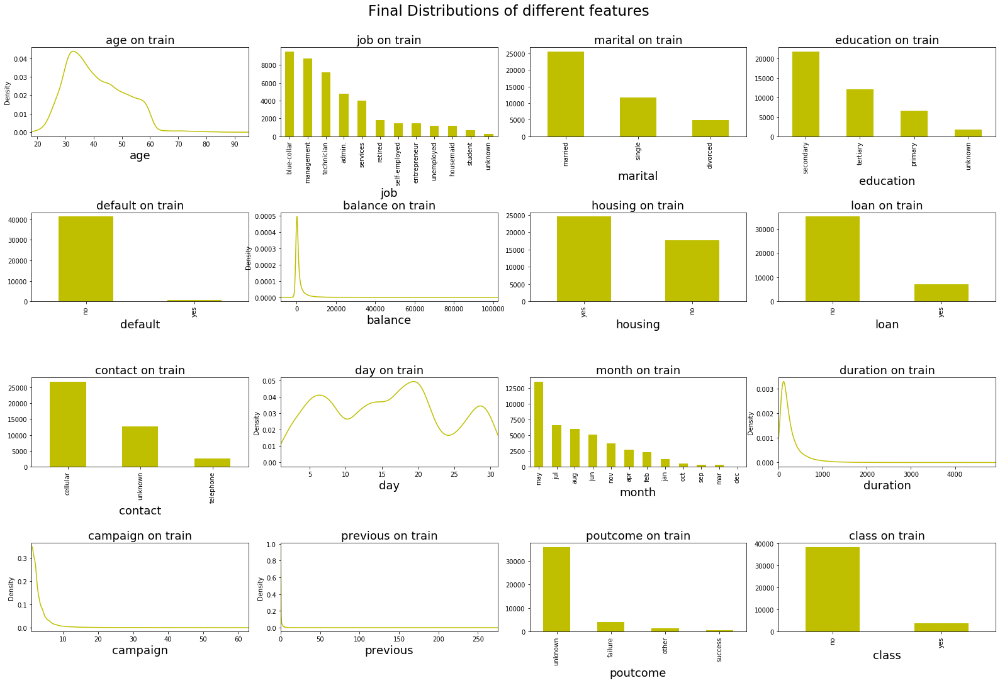

In [11]:
def plot_dist(col, ax):
    if col not in ['age', 'balance', 'day','duration','campaign', 'previous']:
        df[col].value_counts().plot(kind='bar', facecolor='y', ax=ax)
    else:
        df[col].plot(kind='density', ax=ax, bw_method = 0.15, color='y', xlim=(df[col].min(), df[col].max()))
    ax.set_xlabel('{}'.format(col), fontsize=18)
    ax.set_title("{} on train".format(col), fontsize= 18)
    return ax

f, ax = plt.subplots(4,4, figsize = (22,15))
f.tight_layout(h_pad=10, w_pad=2, rect=[0, 0.03, 1, 0.93])
cols = ['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'previous',
       'poutcome', 'class']
k = 0
for i in range(4):
    for j in range(4):
        plot_dist(cols[k], ax[i][j])
        k += 1
__ = plt.suptitle("Final Distributions of different features", fontsize= 23)

In [12]:
def plot_barh(df,col, cmap = None, stacked=False, norm = None):
    df.plot(kind='barh', colormap=cmap, stacked=stacked)
    fig = plt.gcf()
    fig.set_size_inches(24,12)
    plt.title("Job vs {}-feedback -  train {}".format(col, '(Normalized)' if norm else ''), fontsize= 20)
    plt.ylabel('Job', fontsize = 18)
    plot = plt.xlabel('Frequency', fontsize=18)
    
def norm_counts(t):
    norms = np.linalg.norm(t.fillna(0), axis=1)
    t_norm = t[0:0]
    for row, euc in zip(t.iterrows(), norms):
        t_norm.loc[row[0]] = list(map(lambda x: x/euc, list(row[1])))
    return t_norm

In [13]:
df.job.value_counts()

blue-collar      9509
management       8748
technician       7159
admin.           4758
services         4008
retired          1789
self-employed    1483
entrepreneur     1445
unemployed       1175
housemaid        1166
student           679
unknown           261
Name: job, dtype: int64

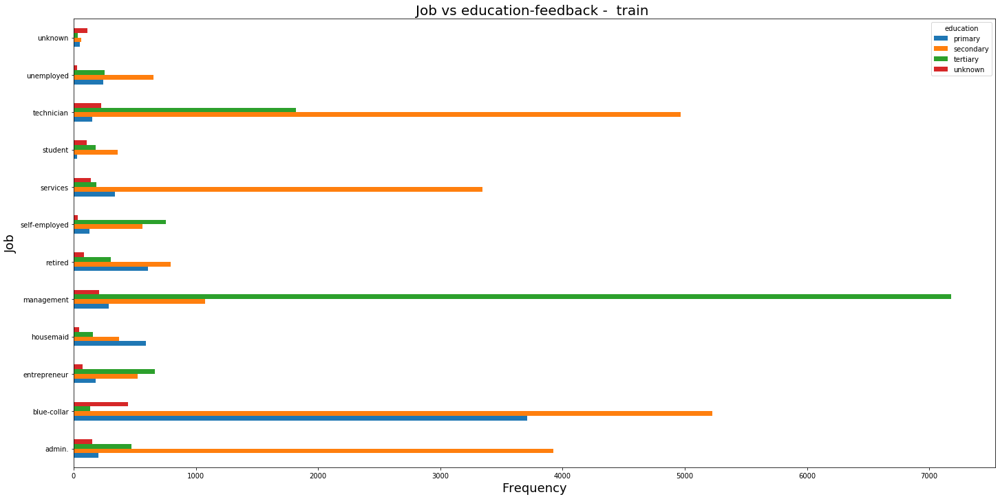

In [14]:
g_by_category = df.groupby('job')
cat_fit = g_by_category['education'].value_counts()
cat_fit = cat_fit.unstack()
cat_fit_norm = norm_counts(cat_fit)
plot_barh(cat_fit, 'education')

Observations:

- Best education response (tertiary) has been highest for mangement.
- Worst education response (tertiary) has been lowest for blue colar.

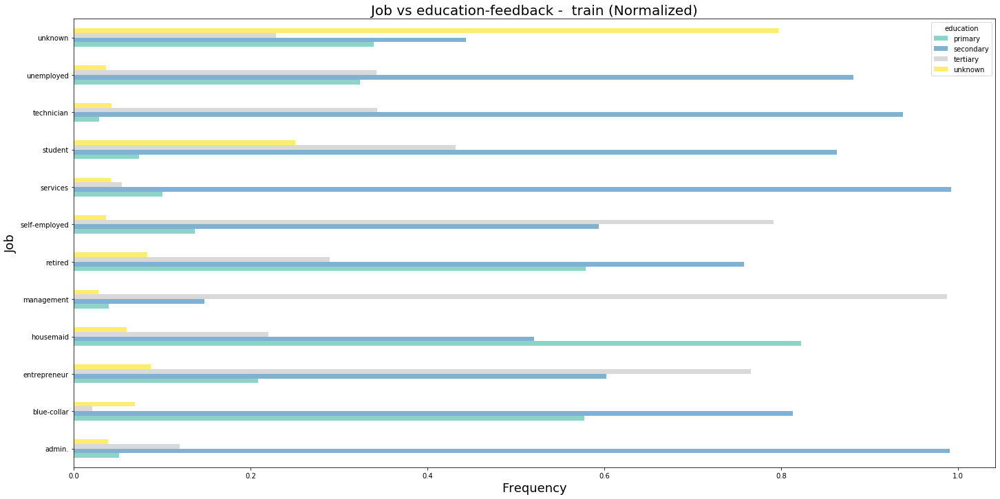

In [15]:
plot_barh(cat_fit_norm, 'education', norm=1, cmap='Set3')

Here, we can see that amongst the jobs themselves:

- Unemplyed, technician, student & services jobss usually have more returns due to secondary eduction.
- Self employed, management, & entrepreneur usually have frequent returns due to tertiary eduction.


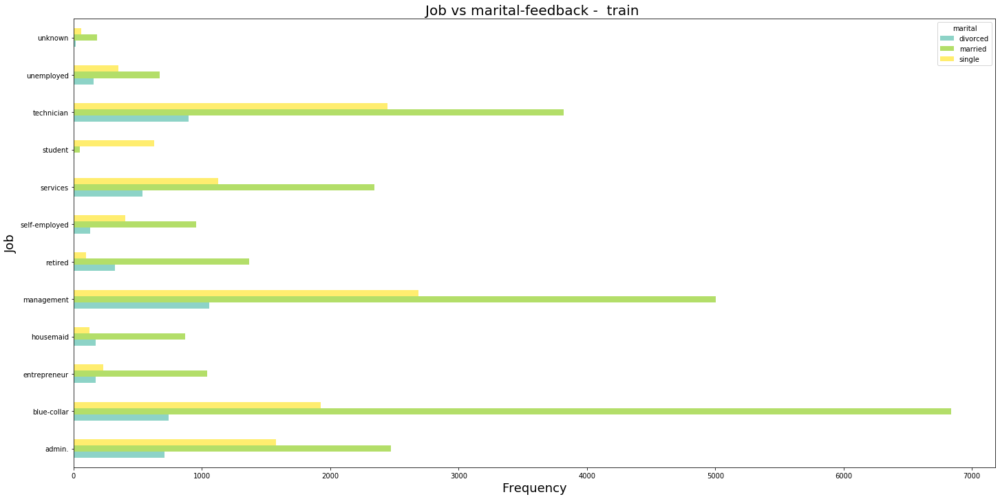

In [16]:
cat_len = g_by_category['marital'].value_counts()
cat_len = cat_len.unstack()
plot_barh(cat_len, 'marital', 'Set3')

- Best marital ('married') belongs to blue colar, management & technician. 
- Best marital ('single') belongs to  management, technician & blue colar. 

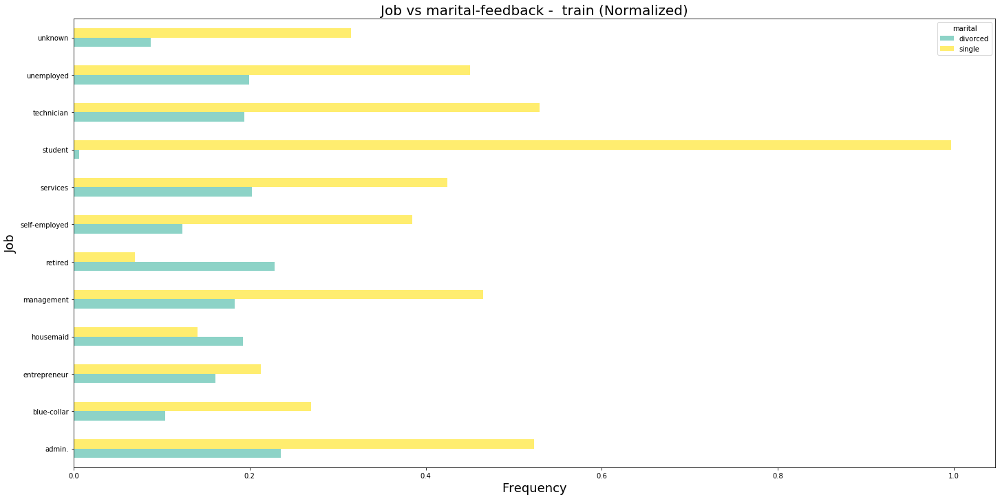

In [17]:
cat_len_norm = norm_counts(cat_len)
cat_len_norm.drop(['married'], axis = 1, inplace=True)
plot_barh(cat_len_norm, 'marital', cmap='Set3', norm=1)


- Most of the students are single 
- Most of the retired are divorced  

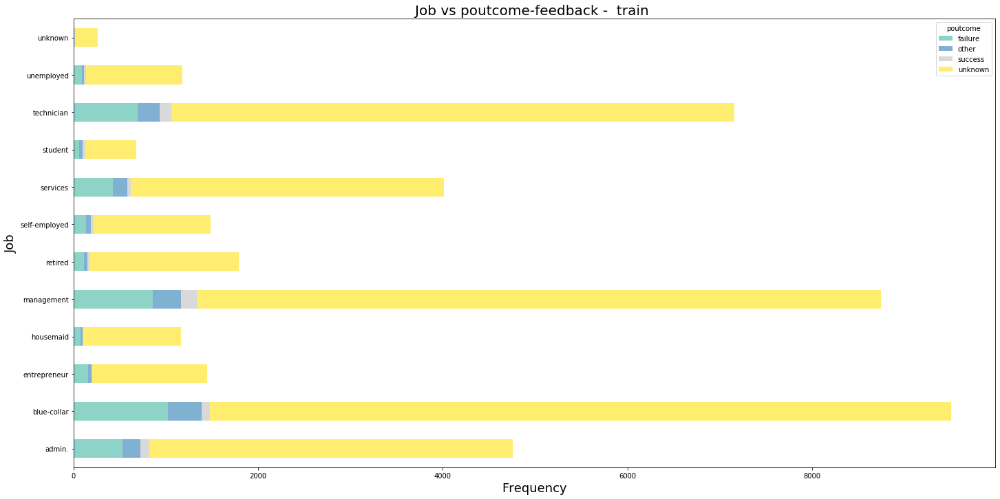

In [18]:
cat_quality = g_by_category['poutcome'].value_counts()
cat_quality = cat_quality.unstack()
plot_barh(cat_quality, 'poutcome', 'Set3', stacked=1)

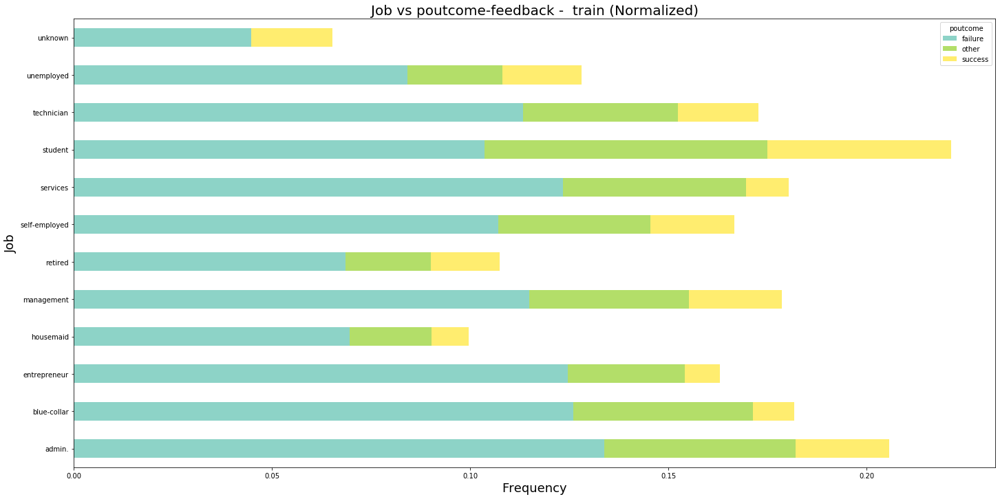

In [19]:
cat_quality_norm = norm_counts(cat_quality)
cat_quality_norm.drop(['unknown'], axis = 1, inplace=True)
plot_barh(cat_quality_norm, 'poutcome', 'Set3', stacked=1, norm=1)

- Here also we can assert our previous observation that all the jobs share similar share of ratings.
- To housemade seem to have a lower share than normal of success ratings in terms of poutcome.

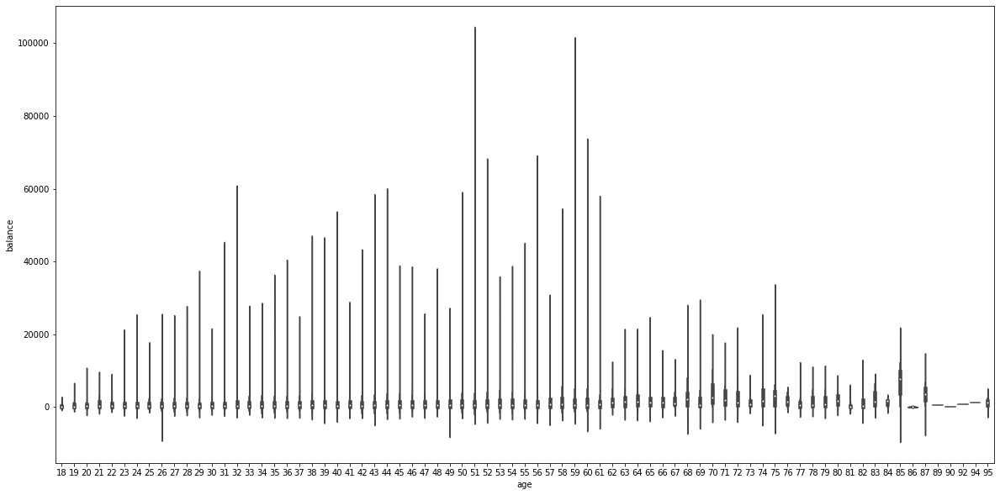

In [20]:
import seaborn as sns
fig = plt.gcf()
fig.set_size_inches(20,10)
__ = sns.violinplot(x='age', y='balance',data=df, size = 20)

We can see here a "linear correlation between age and balance".

Now before using the training data to build the models we'll use 3 kinds of discretizations per model to see if there are any differences in model accuracy.  
The differences will be in numerical features.  
We'll use 5 as the bin count.

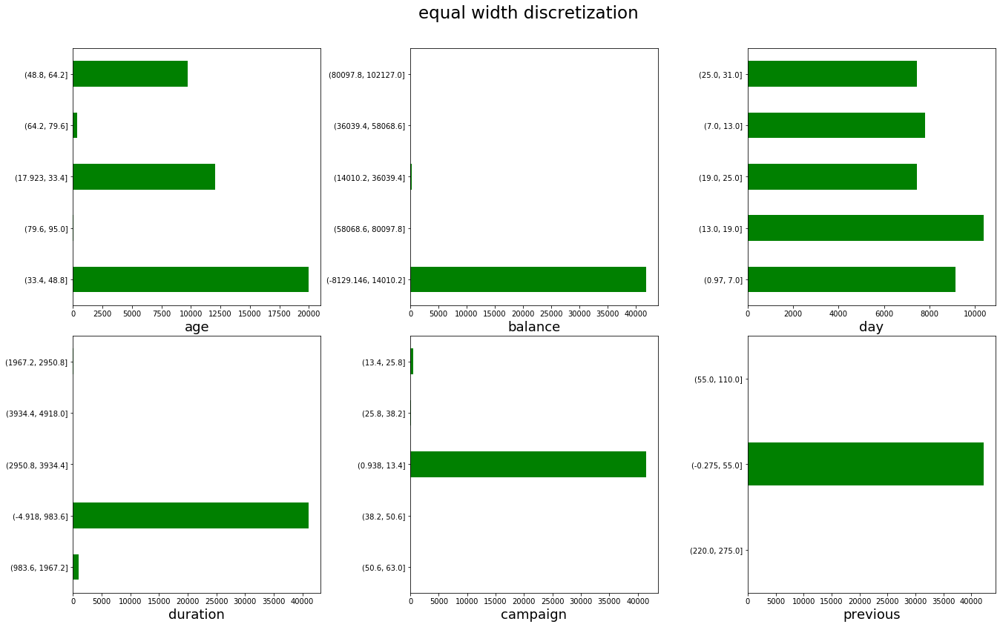

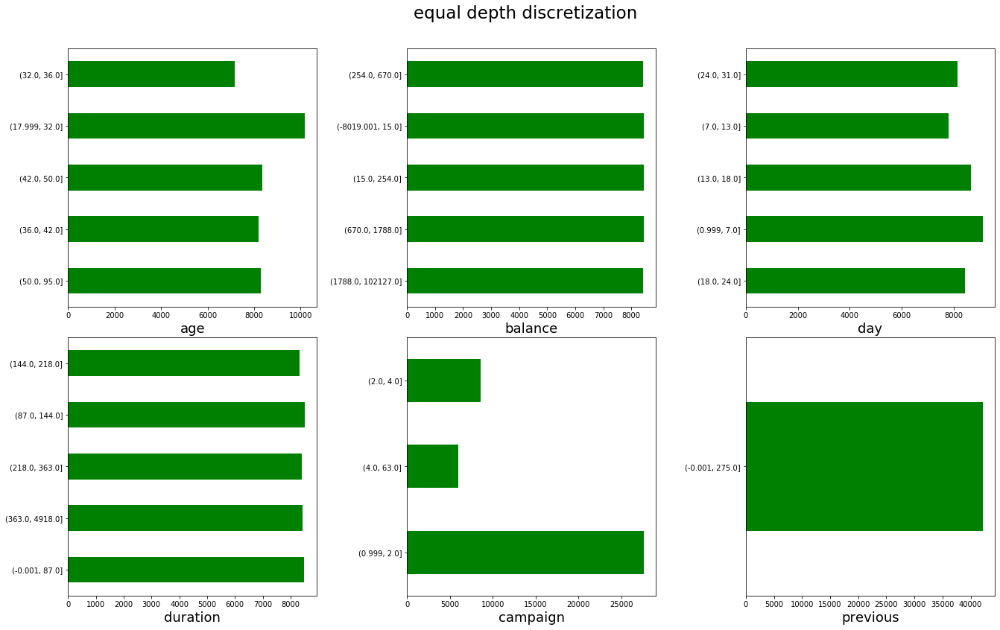

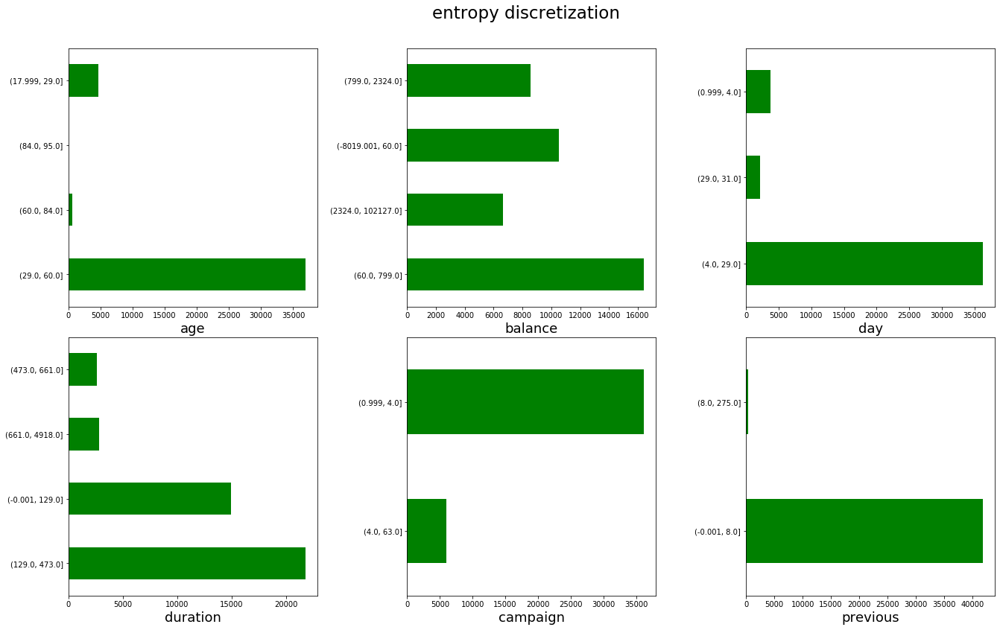

In [21]:
disc_types = ("equal width", "equal depth", "entropy")
# These files used are output from the program
disc_dfs = [pd.read_csv(f"C:/output/Training file processed using {disc} disc.csv", index_col=0) for disc in disc_types]
def plot_dist(df, col, ax):
    df[col].value_counts(sort=False).plot(kind='barh', facecolor='g', ax=ax)
    ax.set_xlabel('{}'.format(col), fontsize=18)
    return ax

for df, title in zip(disc_dfs, disc_types):
    f, axes = plt.subplots(2, 3, squeeze=False, figsize=(18,12))
    f.tight_layout(h_pad=2, w_pad=9, rect=[0, 0.03, 1, 0.93])
    f.suptitle(title + " discretization", fontsize= 23)
    axes_list = []
    for item in axes:
        axes_list += [*item]
    for col, ax in zip(num_cols, axes_list):
        plot_dist(df, col, ax)

We can see a big difference between methods, for example in equal width there is a big bias torwards a certain bin in some of the columns, which is not being that often seen in the equal depth and entropy discretizations.  
(Because entropy disc. is calculated in a divide and conquer fashion there are 4 bins because round(log2(5)) == 2, which the amount recursive depth we went to)

Now we will create the models and test them. Command line parameters:  
`python cli.py -train train.csv -struct Structure.txt -test test.csv -out C:\output -bins 5 -gain 0 -leafs 20 -joblib enable`

Bin count - 5, leaf limit - 20. Why minimum gain 0? because otherwise Type1ID3Tree model will not create a tree because of the structure of the training data.    
 
Now we will show the confusion matrices for each test data evaluation.

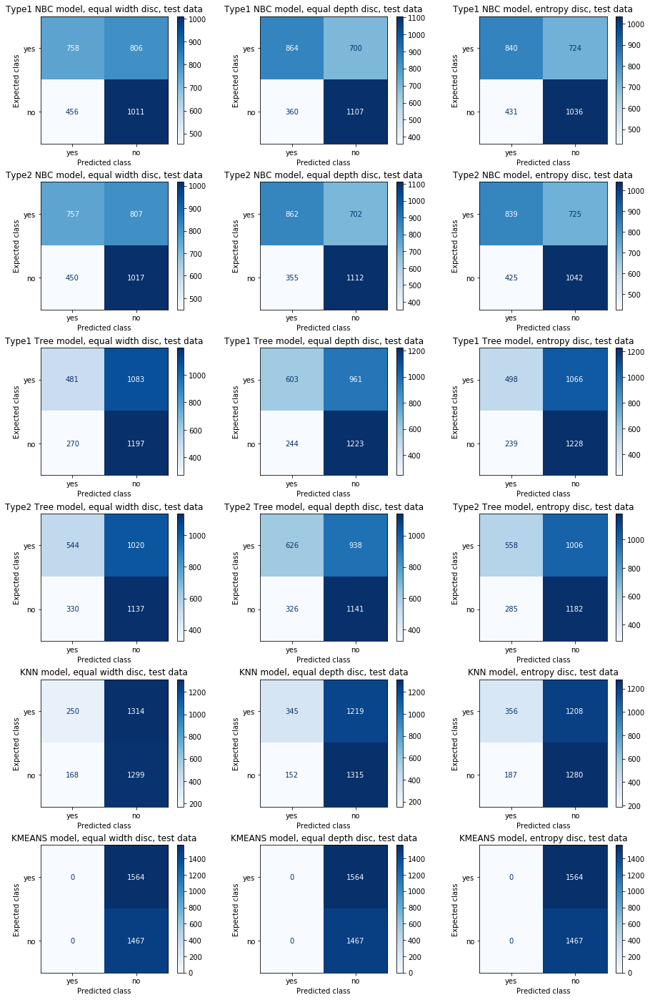

In [22]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

df = pd.read_csv("C:/output/Per sample results - test data.csv")
y_true = df["class"]
y_preds = [df[col] for col in df.drop(labels=["class"], axis=1)][1:]
classes = y_true.unique()
# Inspired by https://stackoverflow.com/questions/59165149/plot-confusion-matrix-with-scikit-learn-without-a-classifier
# And https://scikit-learn.org/0.18/auto_examples/model_selection/plot_confusion_matrix.html
cols, rows = 3, len(y_preds) // 3
fig, axes = plt.subplots(rows, cols, squeeze=False)
alst = []
dfs = dict()
for items in axes:
    alst += [*items]
np.set_printoptions(precision=2)
for y_pred, ax in zip(y_preds, alst):
    mtx = confusion_matrix(y_true, y_pred, labels=classes)
    dfs[y_pred.name] = pd.DataFrame(mtx, columns=classes, index=classes)
    ConfusionMatrixDisplay(mtx, display_labels=classes).plot(ax=ax, cmap=plt.cm.Blues)
    ax.set_title(y_pred.name)
    ax.set_ylabel("Expected class")
    ax.set_xlabel("Predicted class")
fig.subplots_adjust(hspace=0.30)
fig.set_size_inches(cols * 5.2, rows * 4.1)

We can see that the Type1 and Type2 Naive Bayes models give very similar results.  
As well we can see that the Type1 and Type2 Tree models give similar results but not as similar as NB models.   
KNN model gives much poorer results and KMEANS model basically returns "no" for every sample.  
We can also see that also equal width discretization performs poorly compared to equal depth and entropy discretizations.  

Now we will show the other measurements based upon the matrices.

In [23]:
np.seterr(divide='ignore', invalid='ignore')
results = pd.DataFrame(0, index=dfs.keys(), columns=["Precision", "Recall", "Accuracy", "F1 Score"])
for key in dfs:
    df = dfs[key]
    tp, fp, fn, tn = df.at["yes","yes"], df.at["no", "yes"], df.at["yes","no"], df.at["no","no"]
    accuracy = (tp + tn)/(tp + fp + fn + tn)
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    f1score = (2 * (recall * precision)) / (recall + precision)
    results.at[key] = [precision, recall, accuracy, f1score]
df = pd.read_csv("C:/output/overview.csv", index_col=0)
general_results = df[["test" in label for label in df.index]]
general_results.join(results)

,Total Entries,Correct,Errors,Error %,Precision,Recall,Accuracy,F1 Score
"Type1 NBC model, equal width disc, test data",3031,1769,1262,41.64,0.624382,0.484655,0.583636,0.545716
"Type1 NBC model, equal depth disc, test data",3031,1971,1060,34.97,0.705882,0.552430,0.650280,0.619799
"Type1 NBC model, entropy disc, test data",3031,1876,1155,38.11,0.660897,0.537084,0.618938,0.592593
"Type2 NBC model, equal width disc, test data",3031,1774,1257,41.47,0.627175,0.484015,0.585285,0.546373
"Type2 NBC model, equal depth disc, test data",3031,1974,1057,34.87,0.708299,0.551151,0.651270,0.619921
"Type2 NBC model, entropy disc, test data",3031,1881,1150,37.94,0.663766,0.536445,0.620587,0.593352
"Type1 Tree model, equal width disc, test data",3031,1678,1353,44.64,0.640479,0.307545,0.553613,0.415551
"Type1 Tree model, equal depth disc, test data",3031,1826,1205,39.76,0.711924,0.385550,0.602441,0.500207
"Type1 Tree model, entropy disc, test data",3031,1726,1305,43.06,0.675712,0.318414,0.569449,0.432855
"Type2 Tree model, equal width disc, test data",3031,1681,1350,44.54,0.622426,0.347826,0.554602,0.446267


As we can see in matrices the results of tree and naive bayes models have better results than the KNN and KMEANS models with really abysmal recall values.   
Also we can see that that equal depth discretization yield more errors than equal depth and entropy discretizations which more close to each other in error amounts.  

Now show the confusion matrices for the evaluation results against the training data

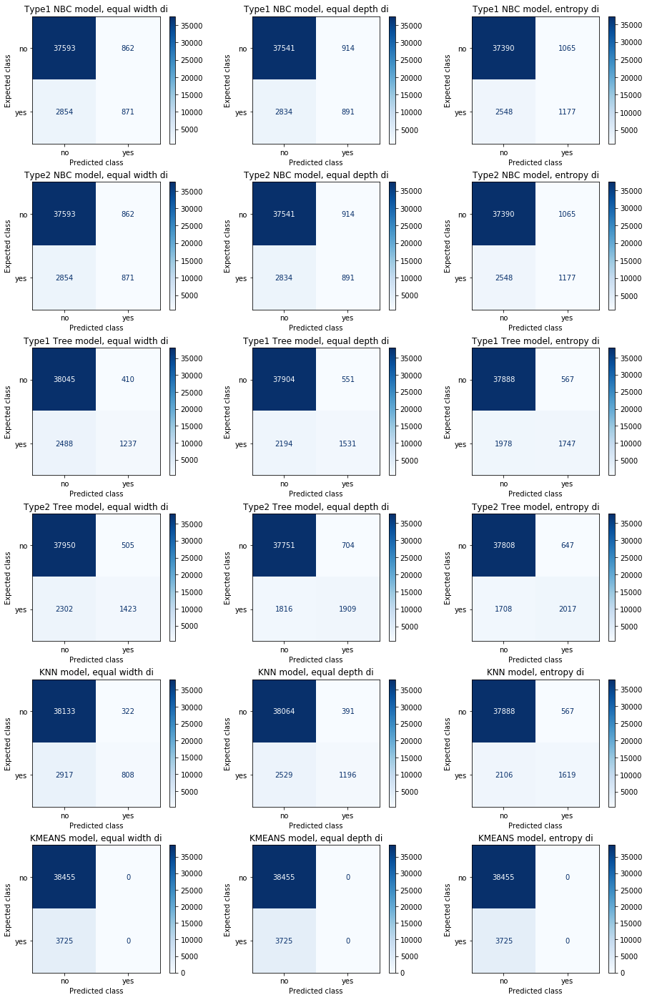

,Total Entries,Correct,Errors,Error %,Precision,Recall,Accuracy,F1 Score
"Type1 NBC model, equal width disc, unprocessed data",42180,38464,3716,8.81,0.502597,0.233826,0.911901,0.319165
"Type1 NBC model, equal depth disc, unprocessed data",42180,38432,3748,8.89,0.493629,0.239195,0.911143,0.322242
"Type1 NBC model, entropy disc, unprocessed data",42180,38567,3613,8.57,0.524978,0.315973,0.914343,0.394503
"Type2 NBC model, equal width disc, unprocessed data",42180,38464,3716,8.81,0.502597,0.233826,0.911901,0.319165
"Type2 NBC model, equal depth disc, unprocessed data",42180,38432,3748,8.89,0.493629,0.239195,0.911143,0.322242
"Type2 NBC model, entropy disc, unprocessed data",42180,38567,3613,8.57,0.524978,0.315973,0.914343,0.394503
"Type1 Tree model, equal width disc, unprocessed data",42180,39282,2898,6.87,0.751063,0.332081,0.931294,0.460536
"Type1 Tree model, equal depth disc, unprocessed data",42180,39435,2745,6.51,0.735351,0.411007,0.934922,0.527295
"Type1 Tree model, entropy disc, unprocessed data",42180,39635,2545,6.03,0.754970,0.468993,0.939663,0.578573
"Type2 Tree model, equal width disc, unprocessed data",42180,39373,2807,6.65,0.738071,0.382013,0.933452,0.503449


In [24]:
df = pd.read_csv("C:/output/Per sample results - train data without discretization.csv")
y_true = df["class"]
y_preds = [df[col] for col in df.drop(labels=["class"], axis=1)][1:]
classes = y_true.unique()
# Inspired by https://stackoverflow.com/questions/59165149/plot-confusion-matrix-with-scikit-learn-without-a-classifier
# And https://scikit-learn.org/0.18/auto_examples/model_selection/plot_confusion_matrix.html
cols, rows = 3, len(y_preds) // 3
fig, axes = plt.subplots(rows, cols, squeeze=False)
fig.subplots_adjust(hspace=0.30)
fig.set_size_inches(cols * 5.2, rows * 4.1)
alst = []
dfs = dict()
for items in axes:
    alst += [*items]
np.set_printoptions(precision=2)
for y_pred, ax in zip(y_preds, alst):
    mtx = confusion_matrix(y_true, y_pred, labels=classes)
    dfs[y_pred.name] = pd.DataFrame(mtx, columns=classes, index=classes)
    ConfusionMatrixDisplay(mtx, display_labels=classes).plot(ax=ax, cmap=plt.cm.Blues)
    ax.set_title(y_pred.name.strip(", unprocessed data"))
    ax.set_ylabel("Expected class")
    ax.set_xlabel("Predicted class")
plt.show()
results = pd.DataFrame(0, index=dfs.keys(), columns=["Precision", "Recall", "Accuracy", "F1 Score"])
for key in dfs:
    df = dfs[key]
    tp, fp, fn, tn = df.at["yes", "yes"], df.at["no", "yes"], df.at["yes", "no"], df.at["no", "no"]
    accuracy = (tp + tn)/(tp + fp + fn + tn)
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    f1score = (2 * (recall * precision)) / (recall + precision)
    results.at[key] = [precision, recall, accuracy, f1score]
df = pd.read_csv("C:/output/overview.csv", index_col=0)
general_results = df[["unprocessed" in label for label in df.index]]
general_results.join(results)

We can see that we have much more "no" classifications in the training and in the predicted results in all models.   
This might suggest that the accuracy metric is flawed because we have many more "no" classifications in the data than "yes" classifications and it also being reflected in the models predictions.  
We can see that KMEANS model still has very poor results. 

Now lets discuss about what we have seen and the reasons for that:  

1. We can see that the training set has a much higher bias torwards "no" classifications (approx 90%), while the test set has more balanced classification distribution (approx 50%).
2. Accuracy numbers alone don't give a full picture, esp. with highly biased data.
3. KNN and KMEANS classifier perform poorly, which is because they are usually used with numerical data-sets, not discrete valued data-sets that are translated to ordinal numbering. These algorithms calculate distances between values in a space which those distances between ordinal values dont have a meaning.
4. Type1Bayes and Type2Bayes have very similar results, which implies that they work in similar way. 
5. Type1Tree and Type2Tree don't have that similar results, which implies there is a difference in how they work.
6. Equal width discretization make models less accurate than Equal depth and Entropy discretizations, probably because its a bit more "blind" way to sort the data.